 
# Convolutional Neural Network Classification Challenge

## Explanation of the data and data source

###### Image Enrollment ###### 

This is the first processs where we register or 'enroll' a user as an example person in our dataset. These example people are members of the group. To achieve this, we made use of a custom dataset as we required facial recognition of members of our group who are not part of any publicly available datasets. Convolutional Neural Networks require a considerate amount of datasets inorder to perform optimally. Our group consists of 10 members, and a total of 7,199 images were taken to be used for the purpose of this assignment.

In creating the dataset, 2 enrolment options were considered.

Option 1 
Enrolment via OpenCV and webcam
This required the building of a python script to facilitate building custom face recognition dataset. The script would:
    * Access the laptop webcam
    * Detect faces
    * Write the frame containing face to hard disk
    
(Adrian Rosebrock,  June 11, 2018 in Faces, Tutorials)

This method was not considered due to project time limitations and we required images that were fully representative of the modern day to day practical ways inwhich images are taken as our target APIs for testing mainly reference from social media accounts. Additionally lighting conditions and image quality from laptop webcams were not optimal. 

Option 2
To cater for multiple environmental effects, pictures were taken using a variety of cameras ranging from iphone to Android powered devices. To quickly generate the images, we made use of the photo burst functions within each camera which allowed us to take an average of 100 pictures for every 10seconds. Each group member was required to change posture for every picture taken inorder to accomodate all angles needed to classify the pictures. The pictures were taken at 8mp resolution to accomodate quality and memory requirements. However, some pictures were taken using higher and lower resolutions to accomodate disparity and generalise our dataset.

##  Objectives of the CNN Algorithm

The objective of this project is solve a Classification problem.Given a set of images our algorithm should be able to identify and classify correctly a given picture of group member and return the name of that group member.

## Exploratotory Data Analysis and Feature Engineering

### Feature extraction

Some frequently used techniques for feature extraction are binarizing and blurring

Binarizing: converts the image array into 1s and 0s. This is done while converting the image to a 2D image. Even gray-scaling can also be used. It gives you a numerical matrix of the image. Grayscale takes much lesser space when stored on Disc.

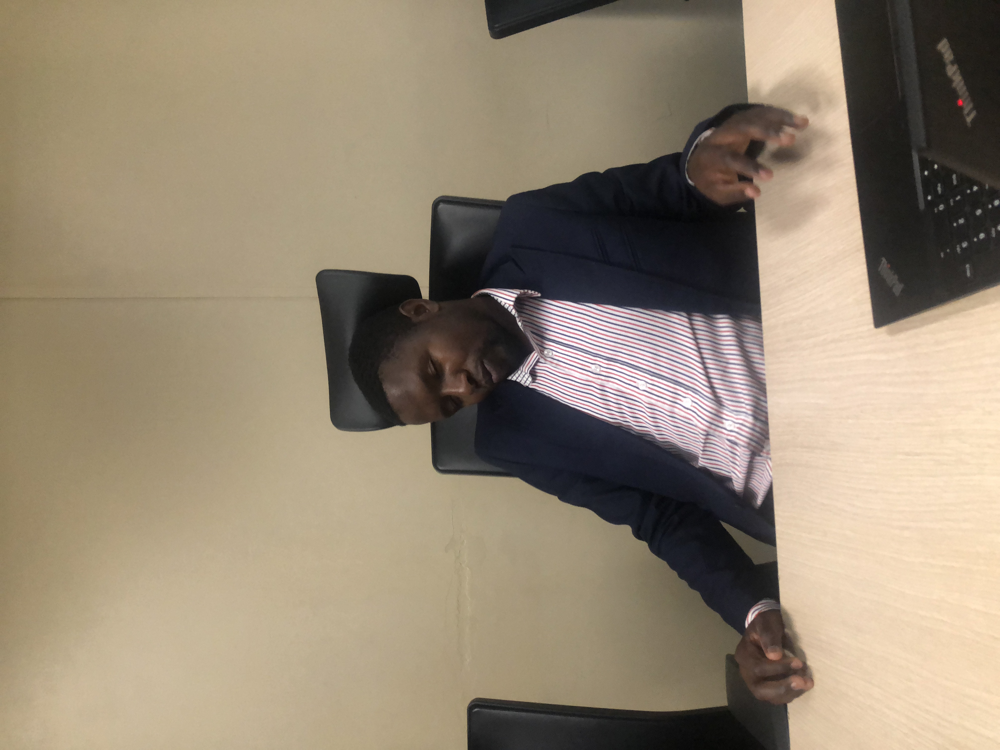

In [47]:
from PIL import Image
Image.LOAD_TRUNCATED_IMAGES = True

%matplotlib inline  

#Import an image
image = Image.open("cutfaces/training_set/Ashley/IMG_0001.JPG")


image

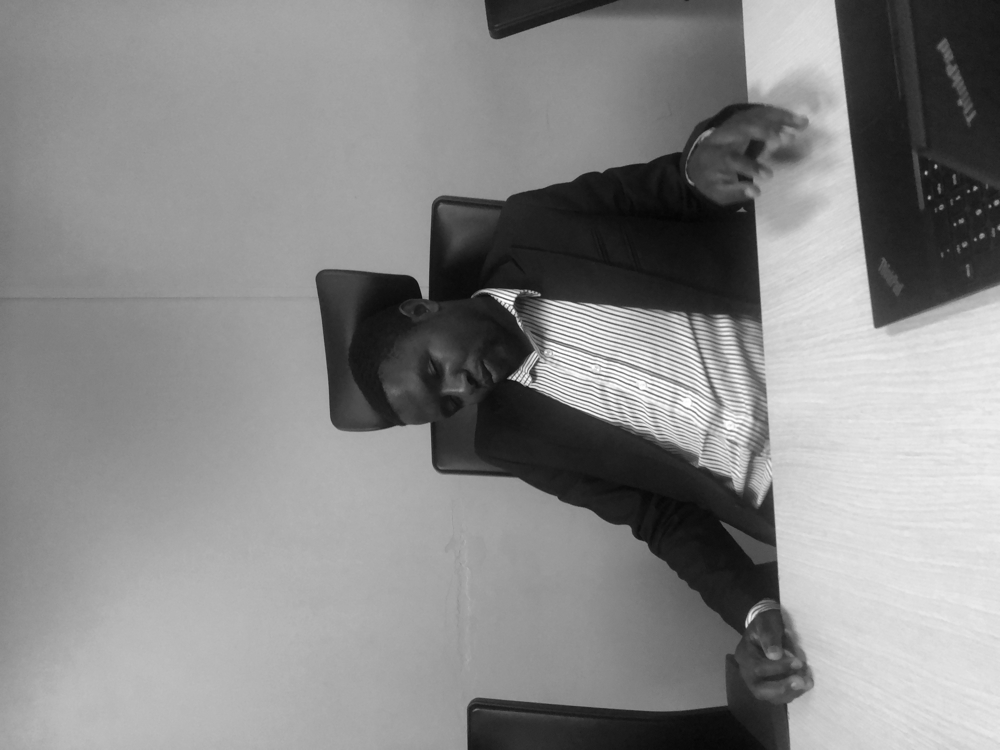

In [48]:
#convert into gray-scale
im = image.convert('L')

im

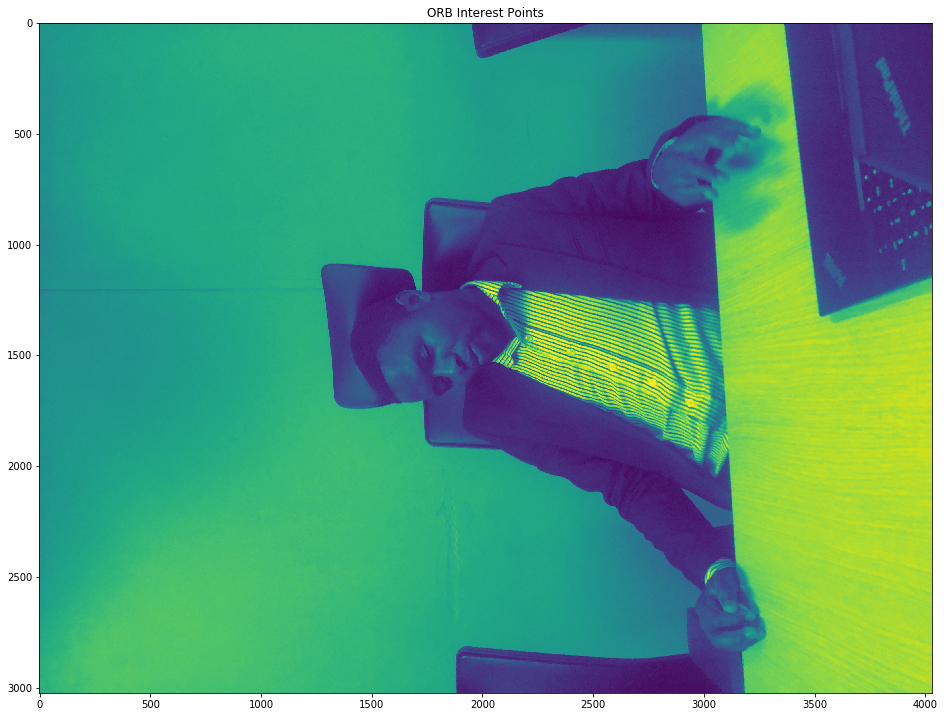

In [49]:

import matplotlib.pyplot as plt
# Draw circles.
plt.figure(figsize=(16, 16))
plt.title('ORB Interest Points')
plt.imshow(im)
plt.show()

## Importing the Keras libraries and packages

In [50]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping,TensorBoard
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

## Explanation of CNN algorithm and parameters used

Convolutional Neural Networks (ConvNets or CNNs) are a category of Neural Networks that have proven very effective in areas such as image recognition and classification. CNNs have been successful in identifying faces, objects and traffic signs apart from powering vision in robots and self driving cars

There are four main operations in the CNN:

Convolution
Non Linearity (ReLU)
Pooling or Sub Sampling
Classification (Fully Connected Layer)


## Initialising the CNN

In [51]:
model = Sequential()

In [52]:
model.add(Conv2D(32, kernel_size=(3, 3), input_shape = (64, 64, 3), activation = 'relu'))
#32 HYPERPRARAMETER CAN BE 64 OR 32, (3,3) FILTER, (64,64,3) COLOR PIC ,3 RGB,


## Pooling
Pooling (also called subsampling or downsampling) reduces the dimensionality of each feature map but retains the most important information.Pooling can be of different types: Max, Average, Sum etc.

In case of Max Pooling, we define a neighborhood (for example, a 2×2 window) and take the largest element from the rectified feature map within that window. Instead of taking the largest element we could also take the average (Average Pooling) or sum of all elements in that window. In practice, Max Pooling has been shown to work better.


#### Layer 2 - Pooling 2x2 window size

In [53]:
model.add(MaxPooling2D(pool_size=(2, 2),strides=(1, 1), padding='valid'))

#### Adding a second convolutional layer

In [54]:
model.add(Conv2D(32, (3, 3), activation = 'relu'))

#### Add Pooling Layer

In [55]:
model.add(MaxPooling2D(pool_size = (2, 2),strides=(1, 1), padding='valid'))

#### Layer 3 - Flattening

In [56]:
model.add(Flatten())

#### Layer 4 - Full connected Layer

In [57]:
model.add(Dense(units = 128, activation = 'relu'))             #model.add(Dense(128, activation = 'relu'))
model.add(Dense(units = 256, activation = 'relu'))
model.add(Dense(units = 10, activation = 'softmax'))

## Compiling the CNN

In [58]:
optimizer = tf.keras.optimizers.SGD(lr=0.0001, momentum=0.9)   #sdg = stocastic gradient descent #lr = learning rate

In [59]:
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

## Fitting the CNN to the images

In [60]:
train_datagen = ImageDataGenerator(rescale = 1./255,                
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

In [61]:
test_datagen = ImageDataGenerator(rescale = 1./255)

In [62]:
training_set = train_datagen.flow_from_directory('cutfaces/training_set',
                                                 target_size = (64, 64),
                                                 batch_size = 10,
                                                 class_mode = 'categorical')

Found 6740 images belonging to 10 classes.


In [63]:
print(training_set.class_indices)

{'Ashley': 0, 'Clifford': 1, 'Desleen': 2, 'Leon': 3, 'Memory': 4, 'Precious': 5, 'Prince': 6, 'Ruth': 7, 'Tanya C': 8, 'Tanya N': 9}


In [64]:
test_set = test_datagen.flow_from_directory('cutfaces/test_set',
                                            target_size = (64, 64),
                                            batch_size = 10,
                                            class_mode = 'categorical')

Found 459 images belonging to 10 classes.


## Architecture diagram of CNN algorithm

![CNN Architecture](https://cdn-images-1.medium.com/max/1600/1*4GLv7_4BbKXnpc6BRb0Aew.png)

![Algorithm-Group-9](https://ibb.co/XkHq8tQ.png)

In [69]:
tensorboard = tf.keras.callbacks.TensorBoard(log_dir='tb_logs', histogram_freq=1,
                          write_graph=True, write_images=True)

## Hyperparameter Tuning applied to boost performance of the CNN algorithm

Tuning hyperparameters for deep neural network is difficult as it is slow to train a deep neural network and there are numerours parameters to configure. 

### Learning rate
Learning rate controls how much to update the weight in the optimization algorithm. We can use fixed learning rate, gradually decreasing learning rate, momentum based methods or adaptive learning rates, depending on our choice of optimizer such as SGD, Adam, Adagrad, AdaDelta or RMSProp.

### Number of epochs
Number of epochs is the the number of times the entire training set pass through the neural network. We should increase the number of epochs until we see a small gap between the test error and the training error.

### Batch size
Mini-batch is usually preferable in the learning process of convnet. A range of 10 to 128 is a good choice to test with. We should note that convnet is sensitive to batch size.

### Activation function
Activation funtion introduces non-linearity to the model. Usually, rectifier works well with convnet. Other alternatives are sigmoid, tanh and other activation functions depening on the task.

### Number of hidden layers and units
It is usually good to add more layers until the test error no longer improves. The trade off is that it is computationally expensive to train the network. Having a small amount of units may lead to underfitting while having more units are usually not harmful with appropriate regularization.

### Weight initialization
We should initialize the weights with small random numbers to prevent dead neurons, but not too small to avoid zero gradient. Uniform distribution usually works well.

### Dropout for regularization
Dropout is a preferable regularization technique to avoid overfitting in deep neural networks. The method simply drops out units in neural network according to the desired probability. A default value of 0.5 is a good choice to test with.

### Grid search or randomized search
Manually tuning hyperparameter is painful and also impractical. There are two generic approaches to sampling search candidates. Grid search exhaustively search all parameter combinations for given values. Random search sample a given number of candidates from a parameter space with a specified distribution.

## Early Stopping
When training neural networks, numerous decisions need to be made regarding the settings (hyperparameters) used, in order to obtain good performance. Once such hyperparameter is the number of training epochs: that is, how many full passes of the data set (epochs) should be used? If we use too few epochs, we might underfit (i.e., not learn everything we can from the training data); if we use too many epochs, we might overfit (i.e., fit the ‘noise’ in the training data, and not the signal).

Early stopping attempts to remove the need to manually set this value. It can also be considered a type of regularization method (like L1/L2 weight decay and dropout) in that it can stop the network from overfitting.

The idea behind early stopping is relatively simple:

*   Split data into training and test sets
*   At the end of each epoch (or, every N epochs):
      *  evaluate the network performance on the test set
      * if the network outperforms the previous best model: save a copy of the network at the current epoch
* Take as our final model the model that has the best test set performance

![early stopping](https://deeplearning4j.org/images/guide/earlystopping.png)

So you create a model checkpoint to save the model each time it improves

In [20]:
checkpoint = ModelCheckpoint("Group_9_model.h5", 
                             monitor='val_acc', 
                             verbose=1, 
                             save_best_only=True, 
                             save_weights_only=False,
                             mode='auto', 
                             period=1)

In [21]:
early = EarlyStopping(monitor='val_acc', 
                      min_delta=0, 
                      patience=10, 
                      verbose=1, 
                      mode='auto')

In [23]:
from tensorflow.keras.callbacks import EarlyStopping
model.fit_generator(training_set,
                    steps_per_epoch = 100,
                    epochs = 30,
                    verbose=1,
                    validation_data = test_set,
                    validation_steps = 50,
                    callbacks = [EarlyStopping(monitor='val_acc', patience=10)])
                   # callbacks=[early,checkpoint,tensorboard])

Epoch 1/30
100/100 [==============================] - 333s 3s/step - loss: 2.1649 - acc: 0.2380 - val_loss: 2.2580 - val_acc: 0.3727
Epoch 2/30
100/100 [==============================] - 355s 4s/step - loss: 1.7530 - acc: 0.4870 - val_loss: 1.9857 - val_acc: 0.5772
Epoch 3/30
100/100 [==============================] - 349s 3s/step - loss: 0.9984 - acc: 0.8530 - val_loss: 1.1234 - val_acc: 0.7856
Epoch 4/30
100/100 [==============================] - 346s 3s/step - loss: 0.3331 - acc: 0.9500 - val_loss: 0.7432 - val_acc: 0.7976
Epoch 5/30
100/100 [==============================] - 307s 3s/step - loss: 0.1828 - acc: 0.9740 - val_loss: 0.8055 - val_acc: 0.7956
Epoch 6/30
100/100 [==============================] - 407s 4s/step - loss: 0.1374 - acc: 0.9660 - val_loss: 0.4362 - val_acc: 0.8156
Epoch 7/30
100/100 [==============================] - 310s 3s/step - loss: 0.0947 - acc: 0.9770 - val_loss: 0.3646 - val_acc: 0.8798
Epoch 8/30
100/100 [==============================] - 341s 3s/step - 

## Load an image to predict 

In [76]:
test_image = image.load_img(r'cutfaces\single_prediction\Tanya.jpg', target_size = (64, 64))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result =model.predict(test_image)

if result[0][0] == 1:
    prediction ='Ashley'

elif result[0][1]==1:
    prediction='Clifford'
elif result[0][2]==1:
    prediction='Desleen'
elif result[0][3]==1:
    prediction='Leon'
elif result[0][4]==1:
    prediction='Memory'
elif result[0][5]==1:
    prediction='Precious'
elif result[0][6]==1:
    prediction='Prince'
elif result[0][7]==1:
    prediction='Ruth'
elif result[0][8]==1:
    prediction='Tanya C'
else:
    prediction='Tanya N'
    

In [77]:
print(prediction)
print(result)

Tanya N
[[1.1703807e-31 1.5208317e-24 9.2598062e-19 6.6296241e-30 9.1878549e-18
  9.2286705e-26 5.2343594e-12 6.9293295e-25 4.2288287e-30 1.0000000e+00]]


## Save and deploy your CNN model

In [86]:
model.save_weights("group.h5")
print("Saved model to disk")

Saved model to disk


In [87]:
with open("model_architecture.json","w") as f:
    f.write(model.to_json())

### 9. Test the deployed CNN model classification from any API of your choice

### 10. Submit the Jupyter Notebook, deployed model and API files to google shared folder